<ipython-input-12-affcdf2baddc>:58: RuntimeWarning: divide by zero encountered in log10
  ims = 20.*np.log10(np.abs(sshow)/10e-6) # amplitude to decibel


timebins:  89986
freqbins:  513


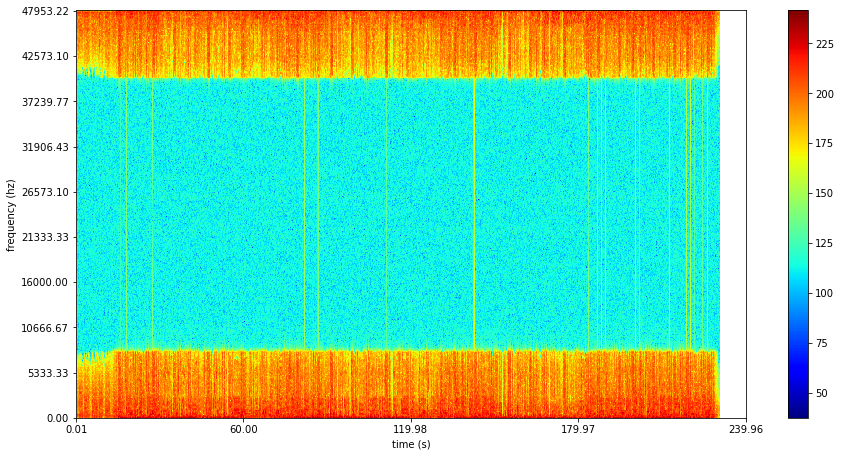

<Figure size 432x288 with 0 Axes>

In [12]:
import numpy as np
from matplotlib import pyplot as plt
import scipy.io.wavfile as wav
from numpy.lib import stride_tricks

""" short time fourier transform of audio signal """
def stft(sig, frameSize, overlapFac=0.5, window=np.hanning):
    win = window(frameSize)
    hopSize = int(frameSize - np.floor(overlapFac * frameSize))

    # zeros at beginning (thus center of 1st window should be for sample nr. 0)   
    samples = np.append(np.zeros(int(np.floor(frameSize/2.0))), sig)    
    # cols for windowing
    cols = np.ceil( (len(samples) - frameSize) / float(hopSize)) + 1
    # zeros at end (thus samples can be fully covered by frames)
    samples = np.append(samples, np.zeros(frameSize))

    frames = stride_tricks.as_strided(samples, shape=(int(cols), frameSize), strides=(samples.strides[0]*hopSize, samples.strides[0])).copy()
    frames *= win

    return np.fft.rfft(frames)    

""" scale frequency axis logarithmically """    
def logscale_spec(spec, sr=44100, factor=20.):
    timebins, freqbins = np.shape(spec)

    scale = np.linspace(0, 1, freqbins) ** factor
    scale *= (freqbins-1)/max(scale)
    scale = np.unique(np.round(scale))

    # create spectrogram with new freq bins
    newspec = np.complex128(np.zeros([timebins, len(scale)]))
    for i in range(0, len(scale)):        
        if i == len(scale)-1:
            newspec[:,i] = np.sum(spec[:,int(scale[i]):], axis=1)
        else:        
            newspec[:,i] = np.sum(spec[:,int(scale[i]):int(scale[i+1])], axis=1)

    # list center freq of bins
    allfreqs = np.abs(np.fft.fftfreq(freqbins*2, 1./sr)[:freqbins+1])
    freqs = []
    for i in range(0, len(scale)):
        if i == len(scale)-1:
            freqs += [np.mean(allfreqs[int(scale[i]):])]
        else:
            freqs += [np.mean(allfreqs[int(scale[i]):int(scale[i+1])])]

    return newspec, freqs

""" plot spectrogram"""
def plotstft(audiopath, binsize=2**10, plotpath=None, colormap="jet"):
    samplerate, samples = wav.read(audiopath)

    s = stft(samples, binsize)

    sshow, freq = logscale_spec(s, factor=1.0, sr=samplerate)

    ims = 20.*np.log10(np.abs(sshow)/10e-6) # amplitude to decibel

    timebins, freqbins = np.shape(ims)

    print("timebins: ", timebins)
    print("freqbins: ", freqbins)

    plt.figure(figsize=(15, 7.5))
    plt.imshow(np.transpose(ims), origin="lower", aspect="auto", cmap=colormap, interpolation="none")
    plt.colorbar()

    plt.xlabel("time (s)")
    plt.ylabel("frequency (hz)")
    plt.xlim([0, timebins-1])
    plt.ylim([0, freqbins])

    xlocs = np.float32(np.linspace(0, timebins-1, 5))
    plt.xticks(xlocs, ["%.02f" % l for l in ((xlocs*len(samples)/timebins)+(0.5*binsize))/samplerate])
    ylocs = np.int16(np.round(np.linspace(0, freqbins-1, 10)))
    plt.yticks(ylocs, ["%.02f" % freq[i] for i in ylocs])

    if plotpath:
        plt.savefig(plotpath, bbox_inches="tight")
    else:
        plt.show()

    plt.clf()

    return ims

ims = plotstft('Inna Ft Daddy Yankee More than Friends (Letra) (online-audio-converter.com).wav')

In [1]:
import os
import matplotlib.pyplot as plt
import random

In [2]:
import librosa
import librosa.display

In [3]:
import IPython.display as ipd
from IPython.display  import Audio

# PROG

In [6]:
ruta_prog = 'C:\\Users\\aperalta\\Downloads\\Diana\\TEyMD_Mineria\\Proyecto\\prog'
pistas_p = os.listdir(ruta_prog)
ruta_prog
print('pistas de prog: ', len(pistas_p))

pistas de prog:  130


In [7]:
ruta_prog

'C:\\Users\\aperalta\\Downloads\\Diana\\TEyMD_Mineria\\Proyecto\\prog'

In [8]:
pistas_p

['01 - The Mountain_02m_00s__03m_00s.mp3',
 '01 A Nightmare To Remember_02m_00s__03m_00s.mp3',
 '01 Acid Rain_02m_00s__03m_00s.mp3',
 '01 Balrog Boogie_02m_00s__03m_00s.mp3',
 "01 C'est la Vie_02m_00s__03m_00s.mp3",
 '01 Clarity_02m_00s__03m_00s.mp3',
 '01 Elephant Talk_02m_00s__03m_00s.mp3',
 '01 Elephant Talk_03m_00s__04m_00s.mp3',
 '01 Jigsaw Hustle_02m_00s__03m_00s.mp3',
 '01 Metropolis, Pt. 1 The Miracle and_02m_00s__03m_00s.mp3',
 '01 Neal And Jack And Me_02m_00s__03m_00s.mp3',
 '01 Red_02m_00s__03m_00s.mp3',
 '01 Stinkfist_02m_00s__03m_00s.mp3',
 '01 The Glass Prision_02m_00s__03m_00s.mp3',
 '01 The Glass Prision_03m_00s__04m_00s.mp3',
 '01 The Grudge_02m_00s__03m_00s.mp3',
 '01 The Grudge_03m_00s__04m_00s.mp3',
 '01 Vicarious_02m_00s__03m_00s.mp3',
 '01 Vicarious_03m_00s__04m_00s.mp3',
 '01 Voodoo Mon Amour_02m_00s__03m_00s.mp3',
 '02 A Rite Of Passage_02m_00s__03m_00s.mp3',
 '02 Dogs_02m_00s__03m_00s.mp3',
 '02 Dogs_03m_00s__04m_00s.mp3',
 '02 Drumhead Trial_02m_00s__03m_00s.m

In [9]:
a = random.randint(0, 129)
samples , sampling_rate = librosa.load(ruta_prog + '\\' + pistas_p[a], sr = None, mono = True, offset = 0.0, duration = None)
len(samples), sampling_rate, a

c:\users\aperalta\downloads\diana\ambientemineria\mineria\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


(2646144, 44100, 112)

In [10]:
samples

array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        1.8862915e-01,  9.1552734e-05, -1.6583252e-01], dtype=float32)

In [11]:
samples.shape

(2646144,)

In [12]:
pistas_p[a]

'10 Sex Tapes_02m_00s__03m_00s.mp3'

In [13]:
Audio(ruta_prog + '\\' + pistas_p[a])

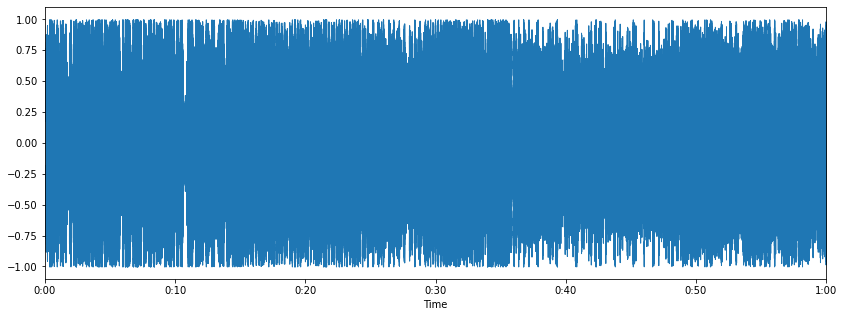

In [14]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(samples, sr=sampling_rate)

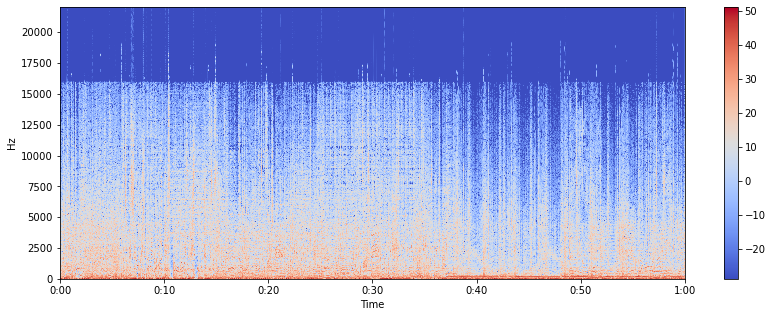

In [15]:
X = librosa.stft(samples)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz')
plt.colorbar()

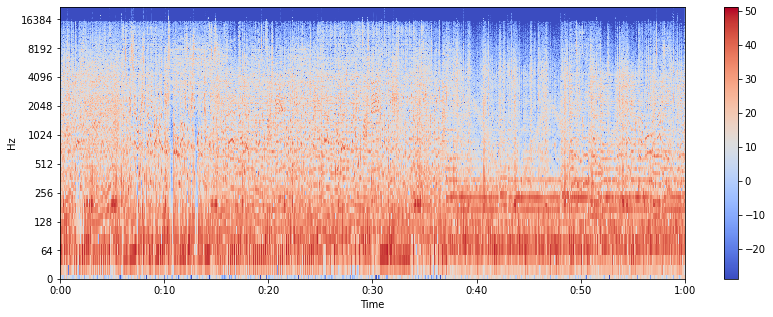

In [16]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log')
plt.colorbar()

# SALSA

In [26]:
ruta_salsa = 'C:\\Users\\aperalta\\Downloads\\Diana\\TEyMD_Mineria\\Proyecto\\salsa'
pistas_s = os.listdir(ruta_salsa)
print('Pistas de salsa: ', len(pistas_s))

Pistas de salsa:  130


In [27]:
pistas_s

['004LA CITA-GALI GALEANO_01m_00s__02m_00s.mp3',
 '004SI SUPIERA-WILLIE GONZALEZ_01m_00s__02m_00s.mp3',
 '005DE PUNTA A PUNTA-CANEO_01m_00s__02m_00s.mp3',
 '006DESDE EL FONDO DE MI CORAZON - HILDEMARO_01m_00s__02m_00s.mp3',
 '006LO QUIERO A MORIR-ZAYDA_01m_00s__02m_00s.mp3',
 '006MI MEDIA MITAD-REY RUIZ_01m_00s__02m_00s.mp3',
 '007AMOR DESECHABLE-LATIN BROTHERS_01m_00s__02m_00s.mp3',
 '007PROCURA-CHICHI PERALTA_01m_00s__02m_00s.mp3',
 '008ASI FUE-NELSON DIAZ Y LA CONSTELACION_01m_00s__02m_00s.mp3',
 '008REYES DEL AMOR-BANDA DEL FUTURO_01m_00s__02m_00s.mp3',
 '009LA PENA QUE YO SIENTO-TANIA_01m_00s__02m_00s.mp3',
 '009SEDA-WILLIE GONZALEZ_01m_00s__02m_00s.mp3',
 '009TU CON EL-FRANKIE RUIZ_01m_00s__02m_00s.mp3',
 '010VESTIDA DE BLANCO-GERMAN CARREÑO_01m_00s__02m_00s.mp3',
 '011CASI TE ENVIDIO-ANDY MONTAÑEZ_01m_00s__02m_00s.mp3',
 '011LLUVIA-EDDIE SANTIAGO_01m_00s__02m_00s.mp3',
 '011PEQUEÑAS COSAS-WILLIE GONZALEZ_01m_00s__02m_00s.mp3',
 '012CONCIENCIA-GILBERTO SANTA ROSA_01m_00s__02m_00s

In [28]:
a = random.randint(0, 129)
samples , sampling_rate = librosa.load(ruta_salsa + '\\' + pistas_s[a], sr = None, mono = True, offset = 0.0, duration = None)
len(samples), sampling_rate, a

(2638080, 44100, 20)

In [29]:
samples

array([ 0.        ,  0.        ,  0.        , ..., -0.00614929,
        0.05863953,  0.10708618], dtype=float32)

In [30]:
pistas_s[a]

'013MIA-EDDIE SANTIAGO_01m_00s__02m_00s.mp3'

In [31]:
Audio(ruta_salsa + '\\' + pistas_s[a])

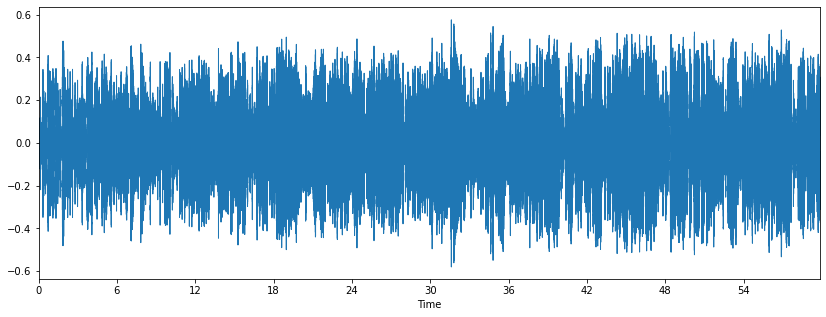

In [32]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(samples, sr=sampling_rate)

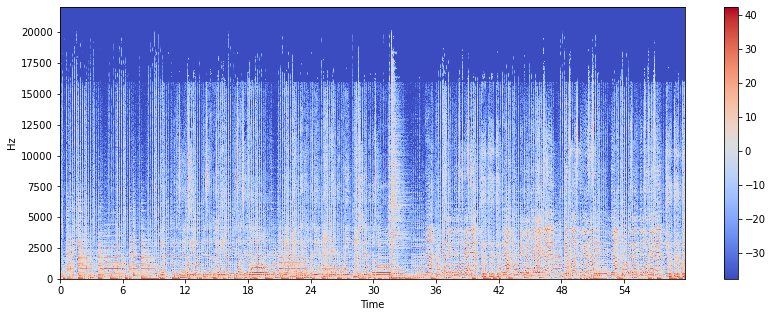

In [33]:
X = librosa.stft(samples)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz')
plt.colorbar()

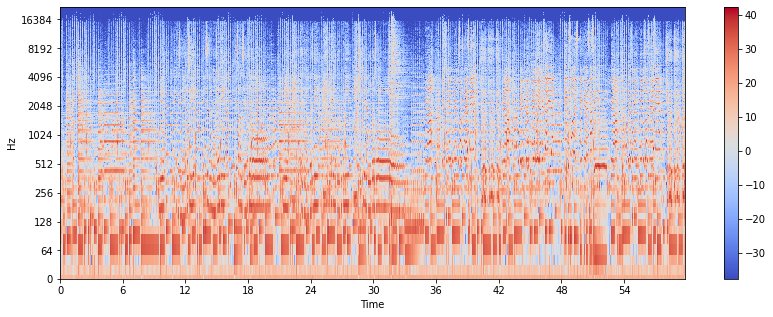

In [34]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log')
plt.colorbar()

In [35]:
Audio(ruta_salsa + '\\' + pistas_s[a])

# Electro

In [36]:
ruta_electro = 'C:\\Users\\aperalta\\Downloads\\Diana\\TEyMD_Mineria\\Proyecto\\electronica'
pistas_e = os.listdir(ruta_electro)
pistas_e

['#Selfie_01m_00s__02m_00s.mp3',
 '(RAGE MIX) DJ BL3ND_01m_00s__02m_00s.mp3',
 '(RAGE MIX) DJ BL3ND_03m_00s__04m_00s.mp3',
 '(ROCKIN MIX) DJ BL3ND_01m_00s__02m_00s.mp3',
 '(ROCKIN MIX) DJ BL3ND_02m_00s__03m_00s.mp3',
 '(SUMMER MIX) DJ BL3ND[7]_01m_00s__02m_00s.mp3',
 '(SUMMER MIX) DJ BL3ND[7]_04m_00s__05m_00s.mp3',
 '01 Faded_01m_00s__02m_00s.mp3',
 '01 Good Evening Chicago_01m_00s__02m_00s.mp3',
 '01 Hot Diana_01m_00s__02m_00s.mp3',
 '01 Lean On_01m_00s__02m_00s.mp3',
 '01 Maximal Crazy (Original Mix)_01m_00s__02m_00s.mp3',
 '01 No Money_01m_00s__02m_00s.mp3',
 '01 Ode To Oi (Original Mix)_01m_00s__02m_00s.mp3',
 '01 Purple Lamborghini_01m_00s__02m_00s.mp3',
 '01 WILD MIX_01m_00s__02m_00s.mp3',
 '01 Yeah (Original Mix)_01m_00s__02m_00s.mp3',
 '02 Good Evening Chicago (Klaus Hill_01m_00s__02m_00s.mp3',
 '02 Without Love_01m_00s__02m_00s.mp3',
 '03 Ass Hypnotized_01m_00s__02m_00s.mp3',
 '03 Haters_00m_00s__01m_00s.mp3',
 '03 Haters_01m_00s__02m_00s.mp3',
 '03 I Dont Know Where_01m_00s__

In [37]:
a = random.randint(0, 129)
samples , sampling_rate = librosa.load(ruta_electro + '\\' + pistas_e[a], sr = None, mono = True, offset = 0.0, duration = None)
len(samples), sampling_rate, a

(2646144, 44100, 6)

In [38]:
samples

array([ 0.        ,  0.        ,  0.        , ...,  0.04544067,
       -0.01412964,  0.02101135], dtype=float32)

In [39]:
pistas_e[a]

'(SUMMER MIX) DJ BL3ND[7]_04m_00s__05m_00s.mp3'

In [40]:
Audio(ruta_electro + '\\' + pistas_e[a])

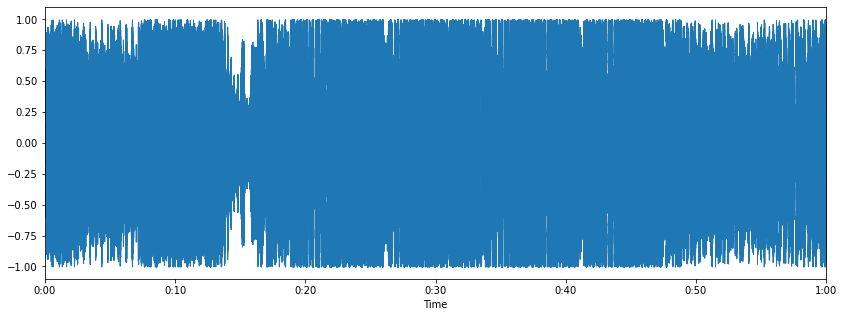

In [41]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(samples, sr=sampling_rate)

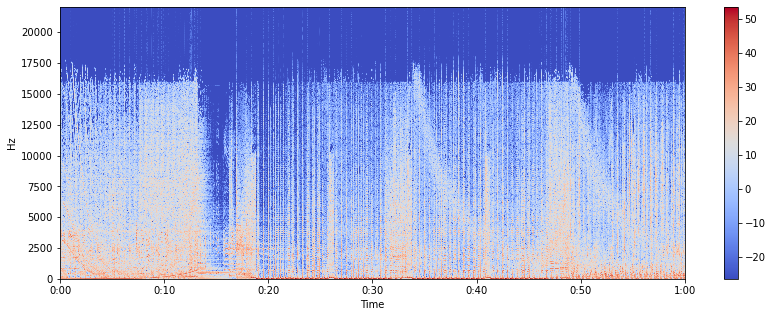

In [42]:
X = librosa.stft(samples)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz')
plt.colorbar()

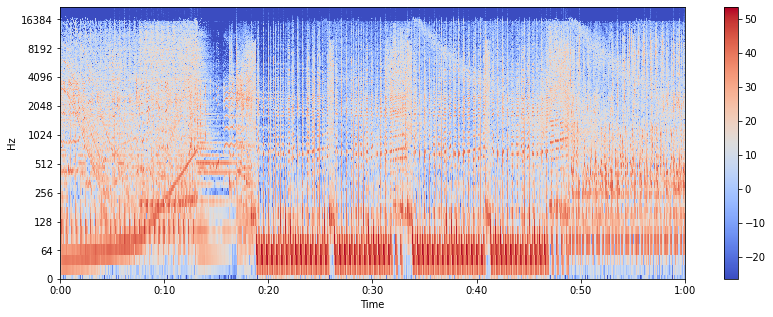

In [43]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log')
plt.colorbar()

In [44]:
Audio(ruta_electro + '\\' + pistas_e[a])

In [45]:
samples.shape

(2646144,)

In [46]:
samples

array([ 0.        ,  0.        ,  0.        , ...,  0.04544067,
       -0.01412964,  0.02101135], dtype=float32)

In [47]:
sampling_rate

44100

In [48]:
type(samples)

numpy.ndarray

In [2]:
import seaborn as sns
import pandas as pd
from matplotlib import pyplot as plt

In [5]:
url = 'https://python-graph-gallery.com/wp-content/uploads/mtcars.csv'
df = pd.read_csv(url)
#df = df.set_index('model')
df

,model,mpg,cyl,disp,hp,drat,wt,qsec,vs,am,gear,carb
0,Mazda RX4,21.0,6,160.0,110,3.90,2.620,16.46,0,1,4,4
1,Mazda RX4 Wag,21.0,6,160.0,110,3.90,2.875,17.02,0,1,4,4
2,Datsun 710,22.8,4,108.0,93,3.85,2.320,18.61,1,1,4,1
3,Hornet 4 Drive,21.4,6,258.0,110,3.08,3.215,19.44,1,0,3,1
4,Hornet Sportabout,18.7,8,360.0,175,3.15,3.440,17.02,0,0,3,2
5,Valiant,18.1,6,225.0,105,2.76,3.460,20.22,1,0,3,1
6,Duster 360,14.3,8,360.0,245,3.21,3.570,15.84,0,0,3,4
7,Merc 240D,24.4,4,146.7,62,3.69,3.190,20.00,1,0,4,2
8,Merc 230,22.8,4,140.8,95,3.92,3.150,22.90,1,0,4,2
9,Merc 280,19.2,6,167.6,123,3.92,3.440,18.30,1,0,4,4


In [6]:
df = df.set_index('model')

In [7]:
df

,mpg,cyl,disp,hp,drat,wt,qsec,vs,am,gear,carb
model,,,,,,,,,,,
Mazda RX4,21.0,6,160.0,110,3.90,2.620,16.46,0,1,4,4
Mazda RX4 Wag,21.0,6,160.0,110,3.90,2.875,17.02,0,1,4,4
Datsun 710,22.8,4,108.0,93,3.85,2.320,18.61,1,1,4,1
Hornet 4 Drive,21.4,6,258.0,110,3.08,3.215,19.44,1,0,3,1
Hornet Sportabout,18.7,8,360.0,175,3.15,3.440,17.02,0,0,3,2
Valiant,18.1,6,225.0,105,2.76,3.460,20.22,1,0,3,1
Duster 360,14.3,8,360.0,245,3.21,3.570,15.84,0,0,3,4
Merc 240D,24.4,4,146.7,62,3.69,3.190,20.00,1,0,4,2
Merc 230,22.8,4,140.8,95,3.92,3.150,22.90,1,0,4,2


In [8]:
my_palette = dict(zip(df.cyl.unique(), ["orange","yellow","brown"]))
row_colors = df.cyl.map(my_palette)

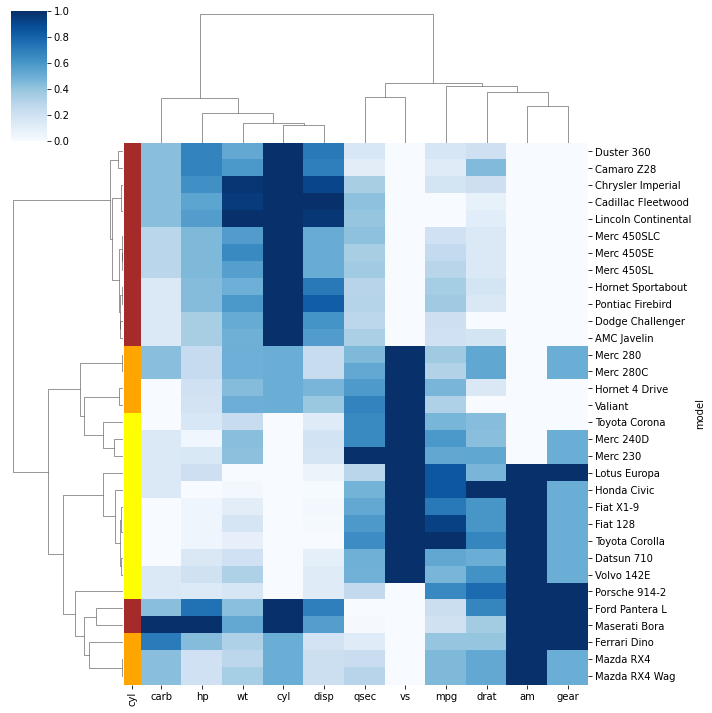

In [9]:
sns.clustermap(df, metric="correlation", method="single", cmap="Blues", standard_scale=1, row_colors=row_colors)

In [10]:
pd.set_option('display.max_columns',500)

In [11]:
a = '..\\data_set\\datos_musica.csv'

In [12]:
df = pd.read_csv(a, sep = ',', encoding = 'utf8')

In [13]:
df

,Unnamed: 0,archivo,zero_cr,zero_crossings_m,spectral_centroid,spectral_bw,spectral_rf,croma,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,BPM,auto_c,genero
0,0,01-TheMountain_02m_00s__03m_00s.mp3,6,0.06,2358.978044,2552.823890,4793.526802,0.470420,-163.372833,165.717529,-50.697205,13.083968,-0.032861,16.523687,-10.634155,13.878497,-0.156555,4.318977,1.155136,3.123753,3.154028,3.419914,1.201207,-3.672799,1.497480,0.186496,0.511725,-5.180268,123.046875,0.772140,prog
1,1,01ANightmareToRemember_02m_00s__03m_00s.mp3,4,0.04,3100.689109,3256.578868,6469.363992,0.596201,-48.062439,135.743393,-53.932007,63.562389,-6.626508,33.995968,-5.462245,21.089064,0.379193,13.363898,-0.915789,8.659492,1.639240,5.244628,1.330808,-2.682353,0.532447,-1.862646,1.804187,-5.636509,109.956782,0.628546,prog
2,2,01AcidRain_02m_00s__03m_00s.mp3,5,0.05,3198.378355,3543.702522,6808.570540,0.546079,-58.244419,134.549545,-35.384872,52.873055,-5.400178,27.031818,-12.117587,20.233650,-8.962458,10.447237,-4.707659,7.385719,-0.928300,4.593798,1.471745,0.739590,0.728077,-4.671610,3.458641,-1.755218,143.554688,0.541958,prog
3,3,01BalrogBoogie_02m_00s__03m_00s.mp3,2,0.02,2942.011868,3163.903990,6050.917527,0.433330,-91.082634,134.391296,-46.598930,44.523190,-2.545116,30.069979,-9.316360,17.695271,-0.801928,9.089577,-1.713330,8.924645,4.266488,2.395693,1.147897,1.289821,-0.101062,-4.962541,3.051191,-2.858684,90.666118,0.541528,prog
4,4,01C'estlaVie_02m_00s__03m_00s.mp3,5,0.05,3123.743239,3337.527859,6499.844646,0.535730,-34.448353,137.779984,-48.767544,63.001434,-11.798602,31.900543,-13.216450,19.975677,-6.714272,13.966826,0.649572,8.866032,1.035663,3.280222,3.242964,-4.131340,1.912559,-6.067165,2.728408,-6.114751,120.185320,0.746078,prog
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,385,WhenLoveTakesOver_01m_00s__02m_00s.mp3,6,0.06,2575.123693,3005.389688,5564.092052,0.502320,-188.561890,145.575531,-41.501461,47.843094,-11.712511,28.348310,-7.600820,13.613605,2.732146,2.947855,3.605409,6.848191,2.274838,-2.674485,5.352834,-0.206322,3.039914,-2.498269,2.183645,-1.435693,129.199219,0.572574,electronica
386,386,WhenTheFunkDrops(OriginalMix)_01m_00s__02m_00s...,15,0.15,3718.115177,3493.782363,7626.795035,0.567823,-58.652626,105.322052,-53.181622,43.308205,-22.160574,26.726955,-12.496088,22.249159,-1.509698,8.357769,-4.032179,5.886038,2.767959,2.678487,2.477016,-1.815939,5.377456,-3.577778,7.179162,-2.833043,129.199219,0.389928,electronica
387,387,Wintermix_01m_00s__02m_00s.mp3,19,0.19,3864.484272,3947.200355,8519.525400,0.480503,-58.399002,118.087608,-31.061525,51.545441,-24.027578,36.409058,-21.325958,20.040140,-15.393820,9.397675,-6.469026,4.237088,-3.188266,0.903239,3.566648,-0.357372,5.836795,-2.829212,2.148330,-6.471159,129.199219,0.530109,electronica
388,388,Yee_01m_00s__02m_00s.mp3,0,0.00,3332.281145,3467.253378,7298.074751,0.431944,-105.453407,114.252968,-18.881662,36.844822,-18.484241,33.493614,-6.559953,18.577913,-5.552446,9.160286,-7.346992,-3.262074,-8.601421,-8.937236,-4.173946,-4.352620,5.287313,-0.805680,5.677492,-4.592224,129.199219,0.467498,electronica


In [14]:
df = df.drop(['Unnamed: 0'], axis = 1)

In [15]:
df

,archivo,zero_cr,zero_crossings_m,spectral_centroid,spectral_bw,spectral_rf,croma,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,BPM,auto_c,genero
0,01-TheMountain_02m_00s__03m_00s.mp3,6,0.06,2358.978044,2552.823890,4793.526802,0.470420,-163.372833,165.717529,-50.697205,13.083968,-0.032861,16.523687,-10.634155,13.878497,-0.156555,4.318977,1.155136,3.123753,3.154028,3.419914,1.201207,-3.672799,1.497480,0.186496,0.511725,-5.180268,123.046875,0.772140,prog
1,01ANightmareToRemember_02m_00s__03m_00s.mp3,4,0.04,3100.689109,3256.578868,6469.363992,0.596201,-48.062439,135.743393,-53.932007,63.562389,-6.626508,33.995968,-5.462245,21.089064,0.379193,13.363898,-0.915789,8.659492,1.639240,5.244628,1.330808,-2.682353,0.532447,-1.862646,1.804187,-5.636509,109.956782,0.628546,prog
2,01AcidRain_02m_00s__03m_00s.mp3,5,0.05,3198.378355,3543.702522,6808.570540,0.546079,-58.244419,134.549545,-35.384872,52.873055,-5.400178,27.031818,-12.117587,20.233650,-8.962458,10.447237,-4.707659,7.385719,-0.928300,4.593798,1.471745,0.739590,0.728077,-4.671610,3.458641,-1.755218,143.554688,0.541958,prog
3,01BalrogBoogie_02m_00s__03m_00s.mp3,2,0.02,2942.011868,3163.903990,6050.917527,0.433330,-91.082634,134.391296,-46.598930,44.523190,-2.545116,30.069979,-9.316360,17.695271,-0.801928,9.089577,-1.713330,8.924645,4.266488,2.395693,1.147897,1.289821,-0.101062,-4.962541,3.051191,-2.858684,90.666118,0.541528,prog
4,01C'estlaVie_02m_00s__03m_00s.mp3,5,0.05,3123.743239,3337.527859,6499.844646,0.535730,-34.448353,137.779984,-48.767544,63.001434,-11.798602,31.900543,-13.216450,19.975677,-6.714272,13.966826,0.649572,8.866032,1.035663,3.280222,3.242964,-4.131340,1.912559,-6.067165,2.728408,-6.114751,120.185320,0.746078,prog
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,WhenLoveTakesOver_01m_00s__02m_00s.mp3,6,0.06,2575.123693,3005.389688,5564.092052,0.502320,-188.561890,145.575531,-41.501461,47.843094,-11.712511,28.348310,-7.600820,13.613605,2.732146,2.947855,3.605409,6.848191,2.274838,-2.674485,5.352834,-0.206322,3.039914,-2.498269,2.183645,-1.435693,129.199219,0.572574,electronica
386,WhenTheFunkDrops(OriginalMix)_01m_00s__02m_00s...,15,0.15,3718.115177,3493.782363,7626.795035,0.567823,-58.652626,105.322052,-53.181622,43.308205,-22.160574,26.726955,-12.496088,22.249159,-1.509698,8.357769,-4.032179,5.886038,2.767959,2.678487,2.477016,-1.815939,5.377456,-3.577778,7.179162,-2.833043,129.199219,0.389928,electronica
387,Wintermix_01m_00s__02m_00s.mp3,19,0.19,3864.484272,3947.200355,8519.525400,0.480503,-58.399002,118.087608,-31.061525,51.545441,-24.027578,36.409058,-21.325958,20.040140,-15.393820,9.397675,-6.469026,4.237088,-3.188266,0.903239,3.566648,-0.357372,5.836795,-2.829212,2.148330,-6.471159,129.199219,0.530109,electronica
388,Yee_01m_00s__02m_00s.mp3,0,0.00,3332.281145,3467.253378,7298.074751,0.431944,-105.453407,114.252968,-18.881662,36.844822,-18.484241,33.493614,-6.559953,18.577913,-5.552446,9.160286,-7.346992,-3.262074,-8.601421,-8.937236,-4.173946,-4.352620,5.287313,-0.805680,5.677492,-4.592224,129.199219,0.467498,electronica


In [16]:
df_aux = df.drop(['archivo'], axis = 1)

In [17]:
df

,archivo,zero_cr,zero_crossings_m,spectral_centroid,spectral_bw,spectral_rf,croma,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,BPM,auto_c,genero
0,01-TheMountain_02m_00s__03m_00s.mp3,6,0.06,2358.978044,2552.823890,4793.526802,0.470420,-163.372833,165.717529,-50.697205,13.083968,-0.032861,16.523687,-10.634155,13.878497,-0.156555,4.318977,1.155136,3.123753,3.154028,3.419914,1.201207,-3.672799,1.497480,0.186496,0.511725,-5.180268,123.046875,0.772140,prog
1,01ANightmareToRemember_02m_00s__03m_00s.mp3,4,0.04,3100.689109,3256.578868,6469.363992,0.596201,-48.062439,135.743393,-53.932007,63.562389,-6.626508,33.995968,-5.462245,21.089064,0.379193,13.363898,-0.915789,8.659492,1.639240,5.244628,1.330808,-2.682353,0.532447,-1.862646,1.804187,-5.636509,109.956782,0.628546,prog
2,01AcidRain_02m_00s__03m_00s.mp3,5,0.05,3198.378355,3543.702522,6808.570540,0.546079,-58.244419,134.549545,-35.384872,52.873055,-5.400178,27.031818,-12.117587,20.233650,-8.962458,10.447237,-4.707659,7.385719,-0.928300,4.593798,1.471745,0.739590,0.728077,-4.671610,3.458641,-1.755218,143.554688,0.541958,prog
3,01BalrogBoogie_02m_00s__03m_00s.mp3,2,0.02,2942.011868,3163.903990,6050.917527,0.433330,-91.082634,134.391296,-46.598930,44.523190,-2.545116,30.069979,-9.316360,17.695271,-0.801928,9.089577,-1.713330,8.924645,4.266488,2.395693,1.147897,1.289821,-0.101062,-4.962541,3.051191,-2.858684,90.666118,0.541528,prog
4,01C'estlaVie_02m_00s__03m_00s.mp3,5,0.05,3123.743239,3337.527859,6499.844646,0.535730,-34.448353,137.779984,-48.767544,63.001434,-11.798602,31.900543,-13.216450,19.975677,-6.714272,13.966826,0.649572,8.866032,1.035663,3.280222,3.242964,-4.131340,1.912559,-6.067165,2.728408,-6.114751,120.185320,0.746078,prog
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,WhenLoveTakesOver_01m_00s__02m_00s.mp3,6,0.06,2575.123693,3005.389688,5564.092052,0.502320,-188.561890,145.575531,-41.501461,47.843094,-11.712511,28.348310,-7.600820,13.613605,2.732146,2.947855,3.605409,6.848191,2.274838,-2.674485,5.352834,-0.206322,3.039914,-2.498269,2.183645,-1.435693,129.199219,0.572574,electronica
386,WhenTheFunkDrops(OriginalMix)_01m_00s__02m_00s...,15,0.15,3718.115177,3493.782363,7626.795035,0.567823,-58.652626,105.322052,-53.181622,43.308205,-22.160574,26.726955,-12.496088,22.249159,-1.509698,8.357769,-4.032179,5.886038,2.767959,2.678487,2.477016,-1.815939,5.377456,-3.577778,7.179162,-2.833043,129.199219,0.389928,electronica
387,Wintermix_01m_00s__02m_00s.mp3,19,0.19,3864.484272,3947.200355,8519.525400,0.480503,-58.399002,118.087608,-31.061525,51.545441,-24.027578,36.409058,-21.325958,20.040140,-15.393820,9.397675,-6.469026,4.237088,-3.188266,0.903239,3.566648,-0.357372,5.836795,-2.829212,2.148330,-6.471159,129.199219,0.530109,electronica
388,Yee_01m_00s__02m_00s.mp3,0,0.00,3332.281145,3467.253378,7298.074751,0.431944,-105.453407,114.252968,-18.881662,36.844822,-18.484241,33.493614,-6.559953,18.577913,-5.552446,9.160286,-7.346992,-3.262074,-8.601421,-8.937236,-4.173946,-4.352620,5.287313,-0.805680,5.677492,-4.592224,129.199219,0.467498,electronica


In [18]:
df_aux

,zero_cr,zero_crossings_m,spectral_centroid,spectral_bw,spectral_rf,croma,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,BPM,auto_c,genero
0,6,0.06,2358.978044,2552.823890,4793.526802,0.470420,-163.372833,165.717529,-50.697205,13.083968,-0.032861,16.523687,-10.634155,13.878497,-0.156555,4.318977,1.155136,3.123753,3.154028,3.419914,1.201207,-3.672799,1.497480,0.186496,0.511725,-5.180268,123.046875,0.772140,prog
1,4,0.04,3100.689109,3256.578868,6469.363992,0.596201,-48.062439,135.743393,-53.932007,63.562389,-6.626508,33.995968,-5.462245,21.089064,0.379193,13.363898,-0.915789,8.659492,1.639240,5.244628,1.330808,-2.682353,0.532447,-1.862646,1.804187,-5.636509,109.956782,0.628546,prog
2,5,0.05,3198.378355,3543.702522,6808.570540,0.546079,-58.244419,134.549545,-35.384872,52.873055,-5.400178,27.031818,-12.117587,20.233650,-8.962458,10.447237,-4.707659,7.385719,-0.928300,4.593798,1.471745,0.739590,0.728077,-4.671610,3.458641,-1.755218,143.554688,0.541958,prog
3,2,0.02,2942.011868,3163.903990,6050.917527,0.433330,-91.082634,134.391296,-46.598930,44.523190,-2.545116,30.069979,-9.316360,17.695271,-0.801928,9.089577,-1.713330,8.924645,4.266488,2.395693,1.147897,1.289821,-0.101062,-4.962541,3.051191,-2.858684,90.666118,0.541528,prog
4,5,0.05,3123.743239,3337.527859,6499.844646,0.535730,-34.448353,137.779984,-48.767544,63.001434,-11.798602,31.900543,-13.216450,19.975677,-6.714272,13.966826,0.649572,8.866032,1.035663,3.280222,3.242964,-4.131340,1.912559,-6.067165,2.728408,-6.114751,120.185320,0.746078,prog
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,6,0.06,2575.123693,3005.389688,5564.092052,0.502320,-188.561890,145.575531,-41.501461,47.843094,-11.712511,28.348310,-7.600820,13.613605,2.732146,2.947855,3.605409,6.848191,2.274838,-2.674485,5.352834,-0.206322,3.039914,-2.498269,2.183645,-1.435693,129.199219,0.572574,electronica
386,15,0.15,3718.115177,3493.782363,7626.795035,0.567823,-58.652626,105.322052,-53.181622,43.308205,-22.160574,26.726955,-12.496088,22.249159,-1.509698,8.357769,-4.032179,5.886038,2.767959,2.678487,2.477016,-1.815939,5.377456,-3.577778,7.179162,-2.833043,129.199219,0.389928,electronica
387,19,0.19,3864.484272,3947.200355,8519.525400,0.480503,-58.399002,118.087608,-31.061525,51.545441,-24.027578,36.409058,-21.325958,20.040140,-15.393820,9.397675,-6.469026,4.237088,-3.188266,0.903239,3.566648,-0.357372,5.836795,-2.829212,2.148330,-6.471159,129.199219,0.530109,electronica
388,0,0.00,3332.281145,3467.253378,7298.074751,0.431944,-105.453407,114.252968,-18.881662,36.844822,-18.484241,33.493614,-6.559953,18.577913,-5.552446,9.160286,-7.346992,-3.262074,-8.601421,-8.937236,-4.173946,-4.352620,5.287313,-0.805680,5.677492,-4.592224,129.199219,0.467498,electronica


In [21]:
df_pg = df.groupby('genero').mean()

In [22]:
df_pg

,zero_cr,zero_crossings_m,spectral_centroid,spectral_bw,spectral_rf,croma,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,BPM,auto_c
genero,,,,,,,,,,,,,,,,,,,,,,,,,,,,
electronica,7.715385,0.077154,3664.769823,3719.675979,7857.998810,0.532508,-65.689816,116.190062,-37.717804,45.229312,-21.328018,31.227044,-13.062522,19.865181,-6.606800,11.919786,-2.089726,6.901863,2.001522,2.897985,3.759977,-0.840888,4.367829,-2.061035,5.707278,-2.616686,127.834031,0.534869
prog,4.892308,0.048923,2633.703679,2944.731812,5422.004875,0.520611,-121.510305,147.896507,-41.057114,46.850062,0.305706,26.756867,-6.182665,15.559259,-1.505437,9.135088,0.658689,4.925011,1.455034,1.789769,1.790361,-1.988850,-0.077769,-2.959955,1.395956,-4.444564,123.038354,0.622049
salsa,7.492308,0.074923,2866.901424,3039.036636,5855.439288,0.419100,-204.440593,140.781212,-40.942452,49.471140,-11.883951,22.663284,-11.767072,11.368040,-3.840248,1.848151,-1.951899,3.850634,-0.208070,-2.329010,2.166250,-3.473790,0.526125,-3.216435,1.328346,-5.358968,116.143151,0.468924


In [24]:
my_palette = dict(zip(df_pg.zero_cr.unique(), ["orange","yellow","brown"]))
row_colors = df_pg.zero_cr.map(my_palette)

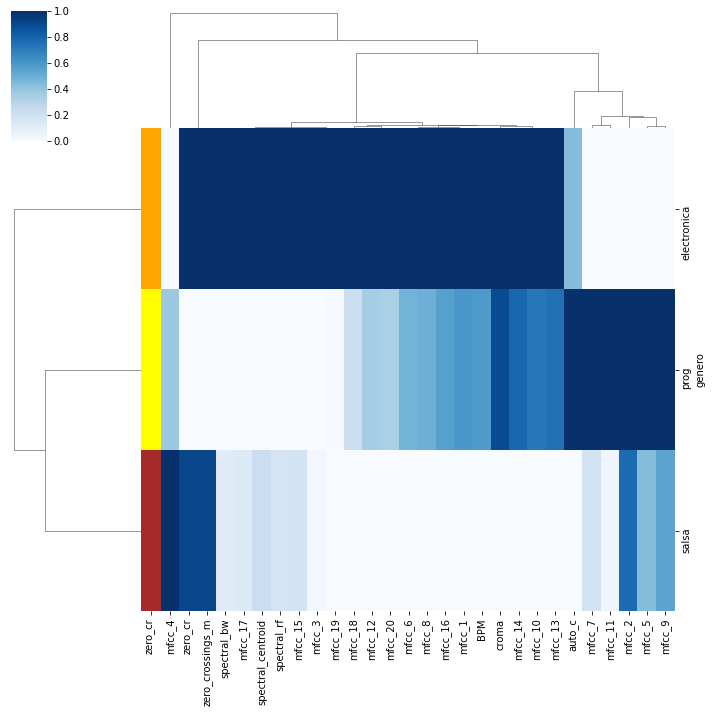

In [25]:
sns.clustermap(df_pg, metric="correlation", method="single", cmap="Blues", standard_scale=1, row_colors=row_colors)

In [27]:
df.groupby('genero').mean()

,zero_cr,zero_crossings_m,spectral_centroid,spectral_bw,spectral_rf,croma,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,BPM,auto_c
genero,,,,,,,,,,,,,,,,,,,,,,,,,,,,
electronica,7.715385,0.077154,3664.769823,3719.675979,7857.998810,0.532508,-65.689816,116.190062,-37.717804,45.229312,-21.328018,31.227044,-13.062522,19.865181,-6.606800,11.919786,-2.089726,6.901863,2.001522,2.897985,3.759977,-0.840888,4.367829,-2.061035,5.707278,-2.616686,127.834031,0.534869
prog,4.892308,0.048923,2633.703679,2944.731812,5422.004875,0.520611,-121.510305,147.896507,-41.057114,46.850062,0.305706,26.756867,-6.182665,15.559259,-1.505437,9.135088,0.658689,4.925011,1.455034,1.789769,1.790361,-1.988850,-0.077769,-2.959955,1.395956,-4.444564,123.038354,0.622049
salsa,7.492308,0.074923,2866.901424,3039.036636,5855.439288,0.419100,-204.440593,140.781212,-40.942452,49.471140,-11.883951,22.663284,-11.767072,11.368040,-3.840248,1.848151,-1.951899,3.850634,-0.208070,-2.329010,2.166250,-3.473790,0.526125,-3.216435,1.328346,-5.358968,116.143151,0.468924
